# Image Decoder Examples

In this notebook we will show usage examples of different flavors of `decoders.image`.  You will see, that those variants offer the same functionality for CPU and GPU backends

Note that we define all the examples to accept the device parameter, so we can later change it easily.

## Common Code

First, let's import DALI dynamic mode and define some common functions.

In [1]:
from collections.abc import Iterable

import matplotlib.gridspec as gridspec
import matplotlib.pyplot as plt
import numpy as np
import nvidia.dali.experimental.dynamic as ndd
import nvidia.dali.types as types

%matplotlib inline

seed = 1549361629

image_dir = "../../data/images"
batch_size = 4


def show_images(image_batch: ndd.Batch):
    columns = 4
    rows = (batch_size + 1) // columns
    fig = plt.figure(figsize=(32, (32 // columns) * rows))
    gs = gridspec.GridSpec(rows, columns)
    for j in range(rows * columns):
        plt.subplot(gs[j])
        plt.axis("off")
        plt.imshow(image_batch.select(j).cpu())

## Image Decoder (CPU)

`decoders.image` decodes images stored in common formats (including JPEG, JPEG2000, TIFF, PNG).

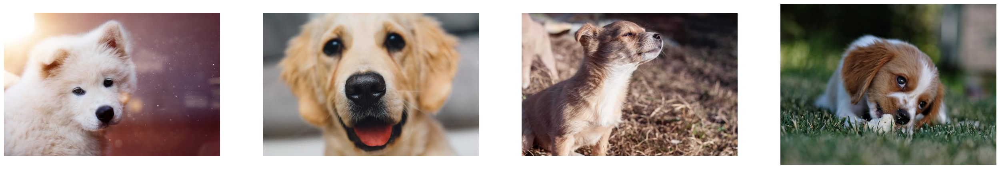

In [2]:
def image_decode(device: str = "cpu"):
    reader = ndd.readers.File(file_root=image_dir, seed=seed)
    for jpegs, labels in reader.next_epoch(batch_size=batch_size):
        yield ndd.decoders.image(jpegs, device=device)


images = next(image_decode())
show_images(images)

## Image Decoder (CPU) with Random Cropping Window Size and Anchor

`decoders.image_random_crop` produces a randomly cropped image. The random cropping window is produced based on a given aspect ratio and area distributions.

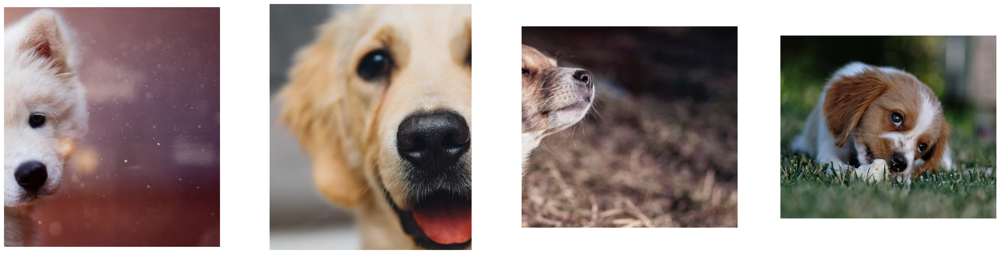

In [3]:
def image_decode_random_crop(device: str = "cpu"):
    reader = ndd.readers.File(file_root=image_dir, seed=seed)
    for jpegs, labels in reader.next_epoch(batch_size=batch_size):
        yield ndd.decoders.image_random_crop(
            jpegs,
            random_aspect_ratio=[0.8, 1.25],
            random_area=[0.1, 1.0],
            num_attempts=100,
            device=device,
            seed=seed,
        )


images = next(image_decode_random_crop())
show_images(images)

## Image Decoder with Fixed Cropping Window Size and External Anchor

`decoders.image_crop` produces a cropped image with a fixed cropping window size and a variable position.

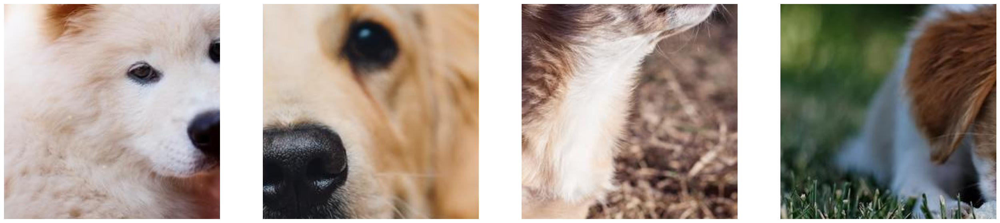

In [4]:
def image_decode_crop(device: str = "cpu"):
    reader = ndd.readers.File(file_root=image_dir, seed=seed)
    rng = ndd.random.RNG(seed)
    for jpegs, labels in reader.next_epoch(batch_size=batch_size):
        pos_x = ndd.random.uniform(
            batch_size=batch_size, range=(0.0, 1.0), rng=rng
        )
        pos_y = ndd.random.uniform(
            batch_size=batch_size, range=(0.0, 1.0), rng=rng
        )
        yield ndd.decoders.image_crop(
            jpegs,
            crop=(244, 244),
            crop_pos_x=pos_x,
            crop_pos_y=pos_y,
            device=device,
        )


images = next(image_decode_crop())
show_images(images)

## Image Decoder (CPU) with External Window Size and Anchor

`decoders.image_slice` produces a cropped image based on additional tensor inputs describing the cropping window size and position.

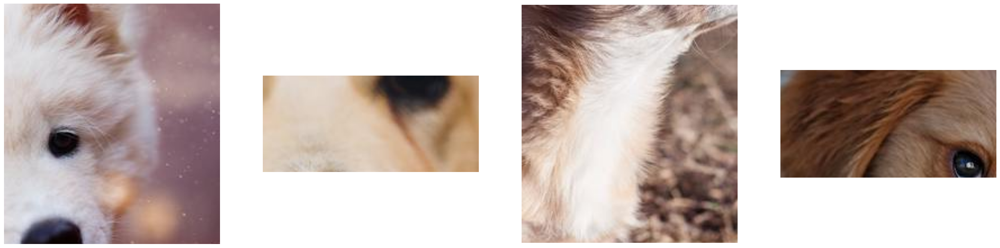

In [5]:
from itertools import cycle, islice, product

pos_source = [[0.4, 0.2], [0.3, 0.3]]
size_source = [[0.3, 0.5], [0.3, 0.2]]


def ext_source_generator():
    gen = cycle(product(pos_source, size_source))
    while True:
        pos, size = zip(
            *islice(gen, batch_size)
        )  # get batches of positions and sizes
        yield pos, size


def image_decode_slice(device: str = "cpu"):
    reader = ndd.readers.File(file_root=image_dir, seed=seed)
    crop_params = ext_source_generator()

    for jpegs, labels in reader.next_epoch(batch_size=batch_size):
        crop_pos, crop_size = next(crop_params)
        # Externally provided iterables are always interpreted as tensors, not batches,
        # so we need to explicitly convert here
        crop_pos, crop_size = ndd.as_batch(crop_pos), ndd.as_batch(crop_size)
        yield ndd.decoders.image_slice(
            jpegs, crop_pos, crop_size, device=device
        )


images = next(image_decode_slice())
show_images(images)

## Image Decoder (Hybrid)

`decoders.image` with GPU backend offloads JPEG decoding to the GPU or a dedicated hardware unit, if present.

Note that we repeat the examples shown above, changing only the device parameter. Both the operator and its other parameters stay the same and offer the same functionality - but now we use GPU acceleration.

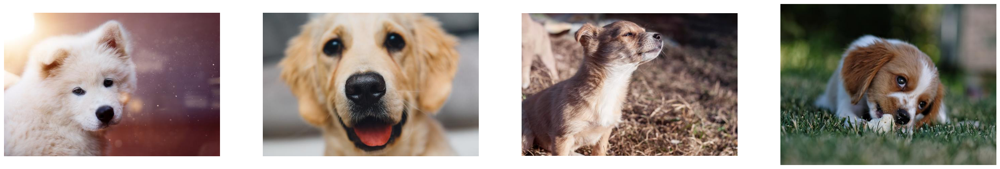

In [6]:
images = next(image_decode(device="gpu"))
show_images(images)

## Image Decoder (Hybrid) with Random Cropping Window Size and Anchor

`decoders.image_random_crop` produces a randomly cropped image. The random cropping window is produced based on a given aspect ratio and area distributions.

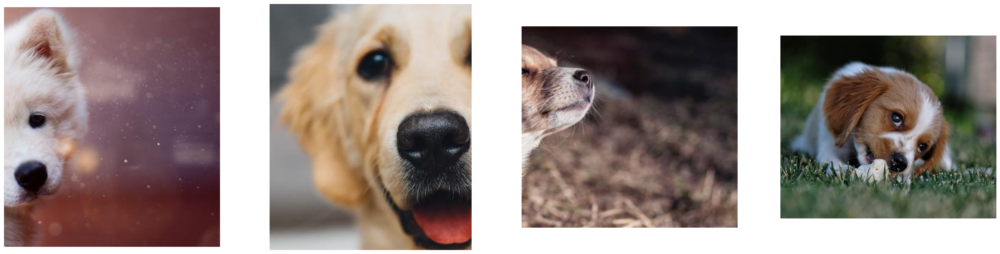

In [7]:
images = next(image_decode_random_crop(device="gpu"))
show_images(images)

## Image Decoder (Hybrid) with Fixed Cropping Window Size and External Anchor

`decoders.image_crop` produces a cropped image with a fixed cropping window size and a variable position.

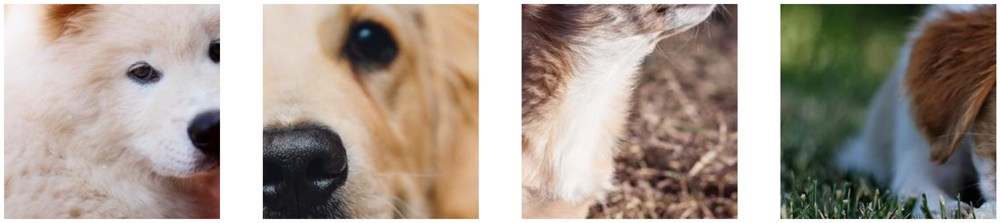

In [8]:
images = next(image_decode_crop(device="gpu"))
show_images(images)

## Image Decoder (Hybrid) with External Window Size and Anchor

`decoders.image_slice` produces a cropped image based on additional tensor inputs describing the cropping window size and position

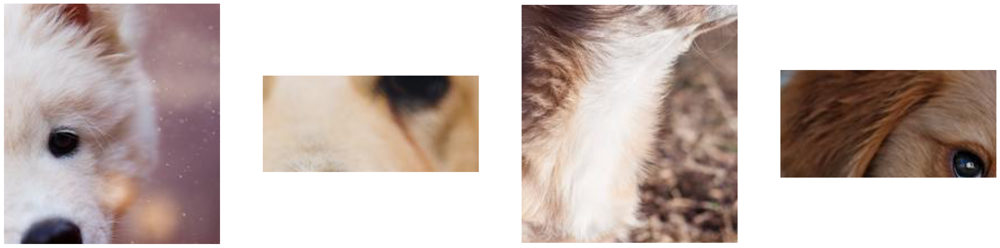

In [9]:
images = next(image_decode_slice(device="gpu"))
show_images(images)